<a href="https://colab.research.google.com/github/DmitryKuptsov/-/blob/main/Home_task_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [60]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import datetime
import random
from statsmodels.stats.power import tt_ind_solve_power

def date_converter(x):
    return datetime.datetime.strptime(x,'%Y-%m-%d')

### Задание 3
**Срок сдачи: 04 апреля 21:00**

**Финальный срок сдачи с понижением балов до 50%: 09 апреля 21:00**

В этом задание вы будете работать с выручкой - метрикой с достаточно высокой дисперсией и соответсвенно низкой чувствительностью к изменениям.

Вам предстоит разработать подход по повышению чувствительности этой метрики.
От успеха данной инициативы зависит то, как быстро мы сможем проверять продуктовые гипотезы.

#### Для планирования эксперимента изучите данные и метрики 2 балла:

- Загрузите файл и изучите данные;
- Изучите основные статистики метрики: среднее, стандартное отклонение;
- Изучите то, как эти статистики изменяются внутри срезов: user_segment, region, category

#### Предскажите минимально детектируемый эффект (MDE) 2 балла:

- Для размеров тестовых групп 10,25,50% и длительностей 30, 60, 90 дней предскажите минимально детектируемый эффект;


#### CUPED 6 баллов
Разработайте подход по снижению дисперсии на основе методики CUPED:

- Рассчитайте CUPED метрику на основе данных за периода в 30 дней перед предполагаемым периодом сбора основной выборки и опишите как изменился MDE для выборок 50/50%, собранных за 30 дней (2 бала). 
- Проверьте насколько данный подход подвержен сезональности. Как меняется MDE, если применять данный подход в разные периоды (2 бала). 
- Оптимизируйте подход варьируя количество дней до теста, которые вы будете для расчёта CUPED метрики. Какое максимальное снижение MDE вы смогли достичь (2 бала).



#### * Стратификация 4 балла (задание для получения дополнительных баллов)
Разработайте подход по снижению дисперсии на основе методики стратификации выборок:

- Стратифицируйте выборки внутри срезов user_segment, region, category
- Рассчитайте стратифицированные среднее,стандартное отклонение для этих выборок и MDE для теста 50/50% длительностью 30 дней.
- В каких срезах достигается наибольшее снижение MDE?



#### Описание данныx

event_date - дата 

user_id - идентификатор пользователя

user_segment - тип продукта

region - регион

category - категория авито

revenue_amount - сумма покупок


In [61]:
df = pd.read_csv('user_amount_var_reduction.csv')
print(df.head())
df['event_date']=df.event_date.apply(date_converter)
print(df.head())

   event_date            user_id  user_segment      category        region  \
0  2019-06-18   4129257975403696  4.626945e+18  7.204754e+18  2.201389e+18   
1  2019-06-18   7225254357470025  4.626945e+18  5.751401e+16  3.048518e+18   
2  2019-06-18   8912846500600569  4.626945e+18  5.983324e+18  3.048518e+18   
3  2019-06-18  20910801279823046  4.626945e+18  6.847326e+18  7.762196e+18   
4  2019-06-18  34873300821657220  2.376074e+18  3.187770e+18  3.855811e+18   

   revenue_amount  
0           139.0  
1           193.0  
2           160.0  
3           209.0  
4           160.0  
  event_date            user_id  user_segment      category        region  \
0 2019-06-18   4129257975403696  4.626945e+18  7.204754e+18  2.201389e+18   
1 2019-06-18   7225254357470025  4.626945e+18  5.751401e+16  3.048518e+18   
2 2019-06-18   8912846500600569  4.626945e+18  5.983324e+18  3.048518e+18   
3 2019-06-18  20910801279823046  4.626945e+18  6.847326e+18  7.762196e+18   
4 2019-06-18  348733008216

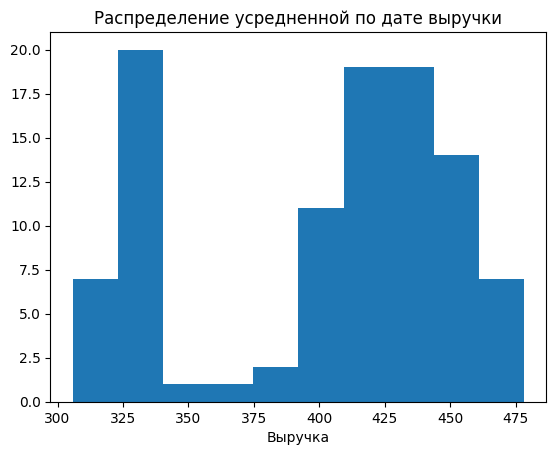

In [62]:
plt.hist(df.groupby(by='event_date').mean()['revenue_amount'])
plt.title('Распределение усредненной по дате выручки')
plt.xlabel('Выручка')
plt.show()

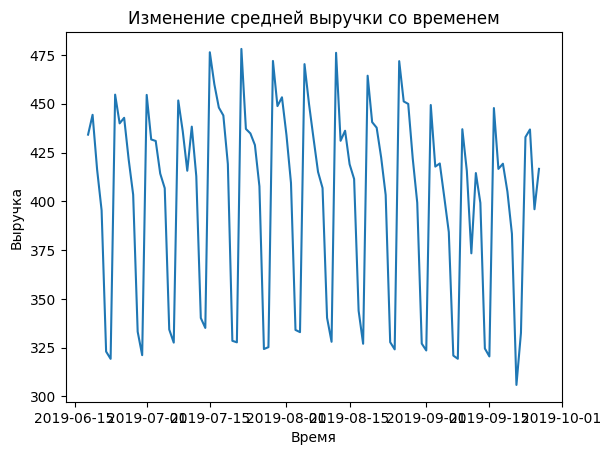

In [63]:
df1 = df.groupby(by='event_date').mean()
df1 = df1.sort_values(by='event_date')
df1.head()

plt.plot(df1['revenue_amount'])
plt.title('Изменение средней выручки со временем')
plt.xlabel('Время')
plt.ylabel('Выручка')
plt.show()

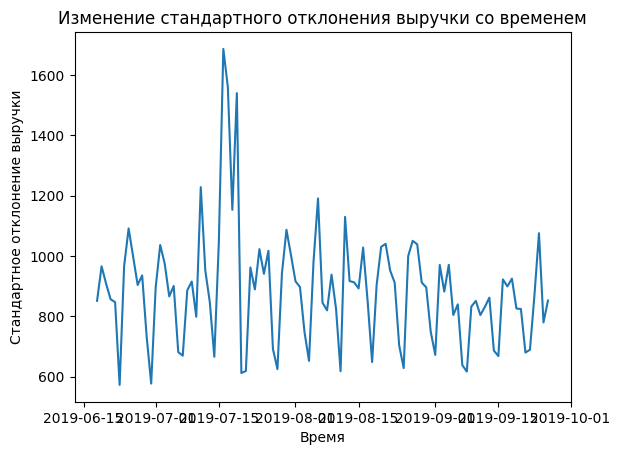

In [64]:
df1 = df.groupby(by='event_date').std()
df1 = df1.sort_values(by='event_date')
plt.plot(df1['revenue_amount'])
plt.title('Изменение стандартного отклонения выручки со временем')
plt.xlabel('Время')
plt.ylabel('Стандартное отклонение выручки')
plt.show()

Мини-вывод

Изменение выручки по категориям user_segment


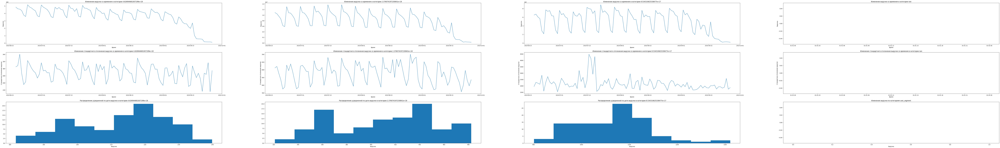

In [65]:
# user_segment
un = df['user_segment'].unique()
print('Изменение выручки по категориям user_segment')
fig, ax = plt.subplots(3, len(un), figsize=(140, 20))
for i in range(len(un)):
    df_new = df[df['user_segment']==un[i]]
    df_new1 = df_new.groupby(by='event_date').sum()
    df_new1 = df_new1.sort_values(by='event_date')
    ax[0][i].plot(df_new1['revenue_amount'])
    ax[0][i].set_title(f'Изменение выручки со временем в категории {un[i]}')
    ax[0][i].set_xlabel('Время')
    ax[0][i].set_ylabel('Выручка')

    df_new2 = df_new.groupby(by='event_date').std()
    df_new2 = df_new2.sort_values(by='event_date')
    ax[1][i].plot(df_new2['revenue_amount'])
    ax[1][i].set_title(f'Изменение стандартного отклонения выручки со временем в категории {un[i]}')
    ax[1][i].set_xlabel('Время')
    ax[1][i].set_ylabel('Стандартное отклонение выручки')


    ax[2][i].hist(df_new.groupby(by='event_date').mean()['revenue_amount'])
    ax[2][i].set_title(f'Распределение усредненной по дате выручки в категории {un[i]}')
    ax[2][i].set_xlabel('Выручка')
    
plt.title('Изменение выручки по категориям user_segment')
plt.show()

Изменение выручки по категориям region


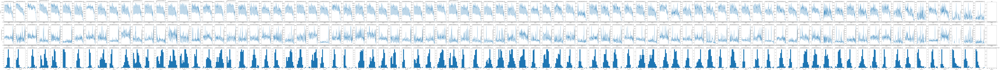

In [66]:
# region
un = df['region'].unique()
print('Изменение выручки по категориям region')
fig, ax = plt.subplots(3, len(un), figsize=(300, 20))
for i in range(len(un)):
    df_new = df[df['region']==un[i]]
    df_new1 = df_new.groupby(by='event_date').sum()
    df_new1 = df_new1.sort_values(by='event_date')
    ax[0][i].plot(df_new1['revenue_amount'])
    ax[0][i].set_title(f'{un[i]}')
    ax[0][i].set_xlabel('Время')
    ax[0][i].set_ylabel('Выручка')

    df_new2 = df_new.groupby(by='event_date').std()
    df_new2 = df_new2.sort_values(by='event_date')
    ax[1][i].plot(df_new2['revenue_amount'])
    ax[1][i].set_title(f'{un[i]}')
    ax[1][i].set_xlabel('Время')
    ax[1][i].set_ylabel('Стандартное отклонение выручки')


    ax[2][i].hist(df_new.groupby(by='event_date').mean()['revenue_amount'])
    ax[2][i].set_title(f'{un[i]}')
    ax[2][i].set_xlabel('Выручка')
    
plt.title('Изменение выручки по категориям region')
plt.show()

In [67]:
# category
un = df['category'].unique()
print('Изменение выручки по категориям category')
fig, ax = plt.subplots(3, len(un), figsize=(400, 50))
for i in range(len(un)):
    df_new = df[df['category']==un[i]]
    df_new1 = df_new.groupby(by='event_date').sum()
    df_new1 = df_new1.sort_values(by='event_date')
    ax[0][i].plot(df_new1['revenue_amount'])
    ax[0][i].set_title(f'{un[i]}')
    ax[0][i].set_xlabel('Время')
    ax[0][i].set_ylabel('Выручка')

    df_new2 = df_new.groupby(by='event_date').std()
    df_new2 = df_new2.sort_values(by='event_date')
    ax[1][i].plot(df_new2['revenue_amount'])
    ax[1][i].set_title(f'{un[i]}')
    ax[1][i].set_xlabel('Время')
    ax[1][i].set_ylabel('Стандартное отклонение выручки')


    ax[2][i].hist(df_new.groupby(by='event_date').mean()['revenue_amount'])
    ax[2][i].set_title(f'{un[i]}')
    ax[2][i].set_xlabel('Выручка')
    
plt.title('Изменение выручки по категориям category')
plt.show()

Изменение выручки по категориям category


Воспользуемся функцией для выбора подвыборки из первой лекции

In [68]:
def choose_date(data, start_date, delta, share): 
    tmp = data[(data.event_date>=start_date)&(data.event_date<=start_date+datetime.timedelta(days=delta))]
    tmp=tmp.groupby(['user_id']).sum().reset_index()
    x = tmp[(tmp.user_id)%100<=int(100*share)].reset_index()
    return x

In [69]:
df = pd.read_csv('user_amount_var_reduction.csv')
df['event_date']=df.event_date.apply(date_converter)

from statsmodels.stats.power import tt_ind_solve_power
alpha = 0.01
power = 0.8
result_effect = 0.04 # целевой размер относительного отклоенения исходной метрики
# effect_size = (mean /std) * result_effect
 
for i in [0.1, 0.25, 0.5]:
    for j in [30, 60, 90]:
        x1 =choose_date(df, datetime.datetime(2019, 7, 1, 0, 0),j,i) #получаем необходимую подвыборку
        mean = x1.revenue_amount.mean()
        std = x1.revenue_amount.std()
 
        effect_size = tt_ind_solve_power(effect_size=None, alpha=alpha, power=power, nobs1=x1.shape[0], ratio=1, alternative = 'two-sided')    
        print(f"result_effect={effect_size/(mean/std)}, days of experiment = {j}, part of all = {i}")# получаем множитель того, во сколько раз необходимо изменить размер выборки

<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()


result_effect=0.13583424834105914, days of experiment = 30, part of all = 0.1


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()


result_effect=0.12868402559770065, days of experiment = 60, part of all = 0.1


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()


result_effect=0.1263052597437024, days of experiment = 90, part of all = 0.1


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()


result_effect=0.08613129712329164, days of experiment = 30, part of all = 0.25


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()


result_effect=0.09122950377388778, days of experiment = 60, part of all = 0.25


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()


result_effect=0.08885982446769097, days of experiment = 90, part of all = 0.25


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()


result_effect=0.05725974638890807, days of experiment = 30, part of all = 0.5


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()


result_effect=0.05808488045395438, days of experiment = 60, part of all = 0.5
result_effect=0.05715782005468044, days of experiment = 90, part of all = 0.5


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()


In [99]:
df_new_1 = df[(df['event_date']>=datetime.datetime(2019, 9, 1, 0, 0))&(df['event_date']<=datetime.datetime(2019, 9, 5, 0, 0))]
df_new_2 = df_new_1.groupby(by='user_id').max()
un_1 = set(df_new_2.index.unique())
df_exp = df[(df['event_date']>=datetime.datetime(2019, 9, 6, 0, 0))&(df['event_date']<=datetime.datetime(2019, 9, 30, 0, 0))]
print(df_exp.shape)
arr_1 = []
cnt = 0
mn = df_new_2.mean()['revenue_amount']
for i in range(len(df_exp)):
    if df_exp['user_id'].iloc[i] in un_1:
        arr_1.append(df_new_2.loc[df_exp['user_id'].iloc[i]]['revenue_amount'])
    else:
        arr_1.append(mn)
    cnt+=1
    if cnt % 1000 == 0:
      print(cnt)


(401588, 6)
1000
2000


<ipython-input-99-a1bba55dada5>:8: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  mn = df_new_2.mean()['revenue_amount']


3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000
33000
34000
35000
36000
37000
38000
39000
40000
41000
42000
43000
44000
45000
46000
47000
48000
49000
50000
51000
52000
53000
54000
55000
56000
57000
58000
59000
60000
61000
62000
63000
64000
65000
66000
67000
68000
69000
70000
71000
72000
73000
74000
75000
76000
77000
78000
79000
80000
81000
82000
83000
84000
85000
86000
87000
88000
89000
90000
91000
92000
93000
94000
95000
96000
97000
98000
99000
100000
101000
102000
103000
104000
105000
106000
107000
108000
109000
110000
111000
112000
113000
114000
115000
116000
117000
118000
119000
120000
121000
122000
123000
124000
125000
126000
127000
128000
129000
130000
131000
132000
133000
134000
135000
136000
137000
138000
139000
140000
141000
142000
143000
144000
145000
146000
147000
148000
149000
150000
151000
152000
153000
154000
155000
156000
157000
158000
159000
16000

In [100]:
print(arr_1[:1000])

[217.0, 411.21792650852257, 411.21792650852257, 1959.0, 1959.0, 230.0, 3996.0, 411.21792650852257, 440.0, 411.21792650852257, 411.21792650852257, 279.0, 411.21792650852257, 411.21792650852257, 411.21792650852257, 350.0, 411.21792650852257, 411.21792650852257, 98.0, 279.0, 2244.0, 411.21792650852257, 411.21792650852257, 411.21792650852257, 411.21792650852257, 411.21792650852257, 944.0, 411.21792650852257, 209.0, 1669.0, 258.0, 411.21792650852257, 411.21792650852257, 411.21792650852257, 411.21792650852257, 411.21792650852257, 411.21792650852257, 411.21792650852257, 411.21792650852257, 832.0, 487.0, 411.21792650852257, 524.0, 411.21792650852257, 411.21792650852257, 188.0, 411.21792650852257, 49.0, 411.21792650852257, 411.21792650852257, 411.21792650852257, 411.21792650852257, 411.21792650852257, 411.21792650852257, 411.21792650852257, 204.0, 104.0, 1954.0, 411.21792650852257, 411.21792650852257, 62.0, 411.21792650852257, 209.0, 3776.0, 411.21792650852257, 411.21792650852257, 237.0, 411.21

In [116]:
df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
teta = np.cov(df_exp.revenue_amount,df_exp.prerev, ddof=1)[1,0]/np.var(df_exp.prerev, ddof=1)
df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
df_exp['cuped_revenue'] = df_exp.revenue_amount - teta * (df_exp.prerev - df_exp.pre_revenue_tg_average)
# print(df_exp['prerev'], df_exp['pre_revenue_tg_average'], df_exp['cuped_revenue'])
print(f"V_cuped={np.std(df_exp['cuped_revenue'], ddof=1)**2}")

print(f"V_total={np.std(df_exp['revenue_amount'], ddof=1)**2}")

V_cuped=518112.0313727802
V_total=645155.0222670027


<ipython-input-116-b2eaf714c90e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-116-b2eaf714c90e>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-116-b2eaf714c90e>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

In [124]:
from statsmodels.stats.power import tt_ind_solve_power
alpha = 0.01
power = 0.8
result_effect = 0.04 # целевой размер относительного отклоенения исходной метрики
# effect_size = (mean /std) * result_effect
 
x1 =choose_date(df_exp, datetime.datetime(2019, 9, 6, 0, 0),30,0.5) #получаем необходимую подвыборку
mean = x1.cuped_revenue.mean()
std = x1.cuped_revenue.std()

effect_size = tt_ind_solve_power(effect_size=None, alpha=alpha, power=power, nobs1=x1.shape[0], ratio=1, alternative = 'two-sided')    
print(f"result_effect={effect_size/(mean/std)}")

result_effect=0.03260930884609166


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()


В данном случае мы можем засечь эффект 3 процента, гораздо меньше, чем в прошлый раз, даже при большем сроке проведения эксперимента.

In [119]:
for k in range(15):
    df_new_1 = df[(df['event_date']>=datetime.datetime(2019, 8, 30-k, 0, 0))&(df['event_date']<=datetime.datetime(2019, 9, 5, 0, 0))]
    df_new_2 = df_new_1.groupby(by='user_id').mean()
    un_1 = set(df_new_2.index.unique())
    df_exp = df[(df['event_date']>=datetime.datetime(2019, 9, 6, 0, 0))&(df['event_date']<=datetime.datetime(2019, 9, 30, 0, 0))]
    print(df_exp.shape)
    arr_1 = []
    mn = df_new_2.mean()['revenue_amount']
    for i in range(len(df_exp)):
        if df_exp['user_id'].iloc[i] in un_1:
            arr_1.append(df_new_2.loc[df_exp['user_id'].iloc[i]]['revenue_amount'])
        else:
            arr_1.append(mn)
    df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
    teta = np.cov(df_exp.revenue_amount,df_exp.prerev, ddof=1)[1,0]/np.var(df_exp.prerev, ddof=1)
    df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
    df_exp['cuped_revenue'] = df_exp.revenue_amount - teta * (df_exp.prerev - df_exp.pre_revenue_tg_average)
    # print(df_exp['prerev'], df_exp['pre_revenue_tg_average'], df_exp['cuped_revenue'])
    print(f"k={k}")
    print(f"V_cuped={np.std(df_exp['cuped_revenue'], ddof=1)**2}")

    print(f"V_total={np.std(df_exp['revenue_amount'], ddof=1)**2}")

<ipython-input-119-58e310533e56>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-119-58e310533e56>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-119-58e310533e56>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-119-58e310533e56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=0
V_cuped=412436.53924512124
V_total=645155.0222670027
(401588, 6)


<ipython-input-119-58e310533e56>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-119-58e310533e56>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-119-58e310533e56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=1
V_cuped=402625.061172456
V_total=645155.0222670027


<ipython-input-119-58e310533e56>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-119-58e310533e56>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-119-58e310533e56>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-119-58e310533e56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=2
V_cuped=399575.438135643
V_total=645155.0222670027


<ipython-input-119-58e310533e56>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-119-58e310533e56>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-119-58e310533e56>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-119-58e310533e56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=3
V_cuped=390797.9810881072
V_total=645155.0222670027


<ipython-input-119-58e310533e56>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-119-58e310533e56>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-119-58e310533e56>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-119-58e310533e56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=4
V_cuped=390304.9717423774
V_total=645155.0222670027


<ipython-input-119-58e310533e56>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-119-58e310533e56>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-119-58e310533e56>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-119-58e310533e56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=5
V_cuped=386422.0291294033
V_total=645155.0222670027


<ipython-input-119-58e310533e56>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-119-58e310533e56>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-119-58e310533e56>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-119-58e310533e56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=6
V_cuped=383298.8626865242
V_total=645155.0222670027


<ipython-input-119-58e310533e56>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-119-58e310533e56>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-119-58e310533e56>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-119-58e310533e56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=7
V_cuped=378004.4492328699
V_total=645155.0222670027


<ipython-input-119-58e310533e56>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-119-58e310533e56>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-119-58e310533e56>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-119-58e310533e56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=8
V_cuped=375353.2639475547
V_total=645155.0222670027


<ipython-input-119-58e310533e56>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-119-58e310533e56>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-119-58e310533e56>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-119-58e310533e56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=9
V_cuped=372325.49063040415
V_total=645155.0222670027


<ipython-input-119-58e310533e56>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-119-58e310533e56>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-119-58e310533e56>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-119-58e310533e56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=10
V_cuped=376183.3771750967
V_total=645155.0222670027


<ipython-input-119-58e310533e56>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-119-58e310533e56>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-119-58e310533e56>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-119-58e310533e56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=11
V_cuped=373252.5872680206
V_total=645155.0222670027


<ipython-input-119-58e310533e56>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-119-58e310533e56>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-119-58e310533e56>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-119-58e310533e56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=12
V_cuped=372713.3408132376
V_total=645155.0222670027


<ipython-input-119-58e310533e56>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-119-58e310533e56>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-119-58e310533e56>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-119-58e310533e56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=13
V_cuped=373861.5208340022
V_total=645155.0222670027


<ipython-input-119-58e310533e56>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)
k=14
V_cuped=370777.5890844028
V_total=645155.0222670027


<ipython-input-119-58e310533e56>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-119-58e310533e56>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-119-58e310533e56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

Заметим, что сезонность довольно значительно влияет на эксперимент, так как при изменении количества дней, на которых рассчитывалась pre_revenue, значительно изменялась и дисперсия.

In [125]:
for k in range(5):
    df_new_1 = df[(df['event_date']>=datetime.datetime(2019, 8, 20-k, 0, 0))&(df['event_date']<=datetime.datetime(2019, 9, 5, 0, 0))]
    df_new_2 = df_new_1.groupby(by='user_id').mean()
    un_1 = set(df_new_2.index.unique())
    df_exp = df[(df['event_date']>=datetime.datetime(2019, 9, 6, 0, 0))&(df['event_date']<=datetime.datetime(2019, 9, 30, 0, 0))]
    print(df_exp.shape)
    arr_1 = []
    mn = df_new_2.mean()['revenue_amount']
    for i in range(len(df_exp)):
        if df_exp['user_id'].iloc[i] in un_1:
            arr_1.append(df_new_2.loc[df_exp['user_id'].iloc[i]]['revenue_amount'])
        else:
            arr_1.append(mn)
    df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
    teta = np.cov(df_exp.revenue_amount,df_exp.prerev, ddof=1)[1,0]/np.var(df_exp.prerev, ddof=1)
    df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
    df_exp['cuped_revenue'] = df_exp.revenue_amount - teta * (df_exp.prerev - df_exp.pre_revenue_tg_average)
    # print(df_exp['prerev'], df_exp['pre_revenue_tg_average'], df_exp['cuped_revenue'])
    print(f"k={k}")
    print(f"V_cuped={np.std(df_exp['cuped_revenue'], ddof=1)**2}")

    print(f"V_total={np.std(df_exp['revenue_amount'], ddof=1)**2}")
    from statsmodels.stats.power import tt_ind_solve_power
    alpha = 0.01
    power = 0.8
    result_effect = 0.04 # целевой размер относительного отклоенения исходной метрики
    # effect_size = (mean /std) * result_effect
    
    x1 =choose_date(df_exp, datetime.datetime(2019, 9, 6, 0, 0),30,0.5) #получаем необходимую подвыборку
    mean = x1.cuped_revenue.mean()
    std = x1.cuped_revenue.std()

    effect_size = tt_ind_solve_power(effect_size=None, alpha=alpha, power=power, nobs1=x1.shape[0], ratio=1, alternative = 'two-sided')    
    print(f"result_effect={effect_size/(mean/std)}")

<ipython-input-125-b52643594c2a>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-125-b52643594c2a>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-125-b52643594c2a>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-125-b52643594c2a>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=0
V_cuped=376183.3771750967
V_total=645155.0222670027
result_effect=0.03224529412499166


<ipython-input-125-b52643594c2a>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-125-b52643594c2a>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-125-b52643594c2a>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-125-b52643594c2a>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=1
V_cuped=373252.5872680206
V_total=645155.0222670027
result_effect=0.03218217650454153


<ipython-input-125-b52643594c2a>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-125-b52643594c2a>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-125-b52643594c2a>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-125-b52643594c2a>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=2
V_cuped=372713.3408132376
V_total=645155.0222670027
result_effect=0.03214711775968849


<ipython-input-125-b52643594c2a>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-125-b52643594c2a>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-125-b52643594c2a>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-125-b52643594c2a>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=3
V_cuped=373861.5208340022
V_total=645155.0222670027
result_effect=0.032414891252948344


<ipython-input-125-b52643594c2a>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_new_2 = df_new_1.groupby(by='user_id').mean()


(401588, 6)


<ipython-input-125-b52643594c2a>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['prerev'] = pd.Series(arr_1, index=df_exp.index)
<ipython-input-125-b52643594c2a>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_exp['pre_revenue_tg_average']=df_exp.prerev.mean()
<ipython-input-125-b52643594c2a>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

k=4
V_cuped=370777.5890844028
V_total=645155.0222670027
result_effect=0.03260930884609166


Наименьший MDE в некотором диапазоне получается, если считать pre_revenue на промежутке времени от 18-08 до 05-09. MDE становится равен 3.214.

In [132]:
# user_segment
un = df['user_segment'].unique()
from statsmodels.stats.power import tt_ind_solve_power
alpha = 0.01
power = 0.8

for i in range(len(un)-1):
    df_new = df[df['user_segment']==un[i]]
    print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
    print(f"Стандартное отклонение в категории {un[i]} равно {df_new.std()['revenue_amount']}")
    x1 =choose_date(df_new, datetime.datetime(2019, 9, 6, 0, 0),30,0.5) #получаем необходимую подвыборку
    mean = x1.revenue_amount.mean()
    std = x1.revenue_amount.std()

    effect_size = tt_ind_solve_power(effect_size=None, alpha=alpha, power=power, nobs1=x1.shape[0], ratio=1, alternative = 'two-sided')    
    print(f"result_effect={effect_size/(mean/std)} в категории {un[i]}")
    

<ipython-input-132-ea54db1420c7>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")


Среднее в категории 4.626944681007199e+18 равно 214.37481812799334
Стандартное отклонение в категории 4.626944681007199e+18 равно 292.52925057113197


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()


result_effect=0.02919394356534333 в категории 4.626944681007199e+18


<ipython-input-132-ea54db1420c7>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")


Среднее в категории 2.376074197230841e+18 равно 420.12930046973224
Стандартное отклонение в категории 2.376074197230841e+18 равно 595.3859253582413
result_effect=0.039024991593769404 в категории 2.376074197230841e+18


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-132-ea54db1420c7>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")


Среднее в категории 8.534310625338477e+17 равно 1083.6833068259973
Стандартное отклонение в категории 8.534310625338477e+17 равно 2320.6876674050277
result_effect=0.16297285798794042 в категории 8.534310625338477e+17


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()


In [133]:
# region
un = df['region'].unique()
from statsmodels.stats.power import tt_ind_solve_power
alpha = 0.01
power = 0.8

for i in range(len(un)-1):
    df_new = df[df['region']==un[i]]
    print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
    print(f"Стандартное отклонение в категории {un[i]} равно {df_new.std()['revenue_amount']}")
    x1 =choose_date(df_new, datetime.datetime(2019, 9, 6, 0, 0),30,0.5) #получаем необходимую подвыборку
    mean = x1.revenue_amount.mean()
    std = x1.revenue_amount.std()

    effect_size = tt_ind_solve_power(effect_size=None, alpha=alpha, power=power, nobs1=x1.shape[0], ratio=1, alternative = 'two-sided')    
    print(f"result_effect={effect_size/(mean/std)} в категории {un[i]}")
    

<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")


Среднее в категории 2.2013887107984737e+18 равно 324.31260945709283
Стандартное отклонение в категории 2.2013887107984737e+18 равно 516.1184989806363
result_effect=0.42314831857894203 в категории 2.2013887107984737e+18
Среднее в категории 3.048517866726461e+18 равно 263.68810413930146
Стандартное отклонение в категории 3.048517866726461e+18 равно 381.370727014459
result_effect=0.1807972290082297 в категории 3.048517866726461e+18
Среднее в категории 7.762196236856042e+18 равно 212.93910612228115
Стандартное отклонение в категории 7.762196236856042e+18 равно 264.8332791414182
result_effect=0.2780533756613482 в категории 7.762196236856042e+18


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with nume

Среднее в категории 3.8558105236110264e+18 равно 389.5813358229497
Стандартное отклонение в категории 3.8558105236110264e+18 равно 786.9541130578352
result_effect=0.1112539421192569 в категории 3.8558105236110264e+18
Среднее в категории 1.49755329312736e+18 равно 338.83049960495396
Стандартное отклонение в категории 1.49755329312736e+18 равно 700.753645057982
result_effect=0.2600522395904577 в категории 1.49755329312736e+18
Среднее в категории 5.106431960058623e+18 равно 366.92531489256606
Стандартное отклонение в категории 5.106431960058623e+18 равно 537.0126670874897
result_effect=0.27010323502835054 в категории 5.106431960058623e+18
Среднее в категории 5.021831474948584e+18 равно 267.38341596608467
Стандартное отклонение в категории 5.021831474948584e+18 равно 349.84168842872634
result_effect=0.379079984932324 в категории 5.021831474948584e+18
Среднее в категории 1.187552825302355e+18 равно 212.24037447813436
Стандартное отклонение в категории 1.187552825302355e+18 равно 303.7375920

<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with nume

result_effect=0.48137595000479927 в категории 3.8566746963313805e+17
Среднее в категории 6.847538829579332e+16 равно 294.4245843100313
Стандартное отклонение в категории 6.847538829579332e+16 равно 445.848075887255
result_effect=0.2680539926416676 в категории 6.847538829579332e+16
Среднее в категории 2.0688813623443203e+18 равно 248.52482481627072
Стандартное отклонение в категории 2.0688813623443203e+18 равно 336.4251402584826
result_effect=0.2626469595308117 в категории 2.0688813623443203e+18


<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only w

Среднее в категории 1.481836092404436e+18 равно 741.5165877220901
Стандартное отклонение в категории 1.481836092404436e+18 равно 1881.3027637263738
result_effect=0.14628887755815492 в категории 1.481836092404436e+18
Среднее в категории 1.283565572874511e+18 равно 447.2921730930428
Стандартное отклонение в категории 1.283565572874511e+18 равно 1005.127759478784
result_effect=0.42823704273100516 в категории 1.283565572874511e+18


<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only w

Среднее в категории 1.1164658163709458e+18 равно 400.9718815763317
Стандартное отклонение в категории 1.1164658163709458e+18 равно 758.2727403895888
result_effect=0.1663668008242176 в категории 1.1164658163709458e+18
Среднее в категории 2.9935651939263273e+18 равно 305.32571674929943
Стандартное отклонение в категории 2.9935651939263273e+18 равно 428.85406203800324
result_effect=0.34611612749364884 в категории 2.9935651939263273e+18
Среднее в категории 8.867014108346121e+18 равно 452.63337898946236
Стандартное отклонение в категории 8.867014108346121e+18 равно 693.9006938180781


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with nume

result_effect=0.16508145323225884 в категории 8.867014108346121e+18
Среднее в категории 6.606447497575229e+18 равно 337.5829219580209
Стандартное отклонение в категории 6.606447497575229e+18 равно 677.8197854209839
result_effect=0.3733244057210528 в категории 6.606447497575229e+18
Среднее в категории 7.487694187147035e+18 равно 231.83693330168526
Стандартное отклонение в категории 7.487694187147035e+18 равно 344.66690313453887
result_effect=0.31593640598774486 в категории 7.487694187147035e+18
Среднее в категории 1.465493388238999e+18 равно 381.2684320594621
Стандартное отклонение в категории 1.465493388238999e+18 равно 576.7474285522279
result_effect=0.2002640322463824 в категории 1.465493388238999e+18
Среднее в категории 5.78054378037293e+18 равно 552.4429153298777
Стандартное отклонение в категории 5.78054378037293e+18 равно 1183.2035562519848
result_effect=0.22037480114750851 в категории 5.78054378037293e+18


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with nume

Среднее в категории 6.733406942778011e+18 равно 329.9716697502313
Стандартное отклонение в категории 6.733406942778011e+18 равно 548.7340413013594
result_effect=0.4484874026758023 в категории 6.733406942778011e+18
Среднее в категории 2.5107795361738056e+18 равно 281.8641157714005
Стандартное отклонение в категории 2.5107795361738056e+18 равно 423.81020974093474
result_effect=0.5824413792229592 в категории 2.5107795361738056e+18
Среднее в категории 9.198008870977546e+18 равно 374.5966269802983
Стандартное отклонение в категории 9.198008870977546e+18 равно 598.0207406262602
result_effect=0.3692458152247205 в категории 9.198008870977546e+18
Среднее в категории 7.887606166042136e+18 равно 220.2419501546298
Стандартное отклонение в категории 7.887606166042136e+18 равно 281.87061044399957
result_effect=0.3544919190677507 в категории 7.887606166042136e+18
Среднее в категории 8.020568142410911e+18 равно 351.3576123706386
Стандартное отклонение в категории 8.020568142410911e+18 равно 595.984331

<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only w

Среднее в категории 6.681910460932232e+18 равно 363.4795041431303
Стандартное отклонение в категории 6.681910460932232e+18 равно 639.6845926345918
result_effect=0.19569573008569918 в категории 6.681910460932232e+18
Среднее в категории 3.609318790733346e+18 равно 341.5533673227413
Стандартное отклонение в категории 3.609318790733346e+18 равно 604.9052744637318
result_effect=0.2857042899526304 в категории 3.609318790733346e+18
Среднее в категории 6.124999673612638e+18 равно 351.64814994847467
Стандартное отклонение в категории 6.124999673612638e+18 равно 597.8332153306192
result_effect=0.23228033939335266 в категории 6.124999673612638e+18
Среднее в категории 7.000315305736052e+18 равно 222.71273100616017
Стандартное отклонение в категории 7.000315305736052e+18 равно 335.912768646329
result_effect=0.4012524142351137 в категории 7.000315305736052e+18
Среднее в категории 2.5188810657624643e+18 равно 249.83342298726913
Стандартное отклонение в категории 2.5188810657624643e+18 равно 392.97547

<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with nume

Среднее в категории 6.741033927585795e+18 равно 411.5687234445919
Стандартное отклонение в категории 6.741033927585795e+18 равно 695.0628354983278
result_effect=0.19462089177718 в категории 6.741033927585795e+18
Среднее в категории 3.6378297855734257e+18 равно 289.91833242916164
Стандартное отклонение в категории 3.6378297855734257e+18 равно 482.53539164395954
result_effect=0.4247204672393999 в категории 3.6378297855734257e+18
Среднее в категории 4.698304106702584e+18 равно 286.8759627077422
Стандартное отклонение в категории 4.698304106702584e+18 равно 479.7130640309979
result_effect=0.1945434002554295 в категории 4.698304106702584e+18
Среднее в категории 4.848067518890897e+18 равно 661.6070530113702
Стандартное отклонение в категории 4.848067518890897e+18 равно 1441.3375337551397
result_effect=0.18536435845828636 в категории 4.848067518890897e+18


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with nume

Среднее в категории 9.159753098538066e+18 равно 333.75907454161666
Стандартное отклонение в категории 9.159753098538066e+18 равно 711.5997072801509
result_effect=0.35418406649918904 в категории 9.159753098538066e+18
Среднее в категории 4.1480454943469343e+18 равно 289.60025788182946
Стандартное отклонение в категории 4.1480454943469343e+18 равно 549.6753566803233
result_effect=0.3742702264447144 в категории 4.1480454943469343e+18
Среднее в категории 6.904191744635402e+17 равно 405.4326448353005
Стандартное отклонение в категории 6.904191744635402e+17 равно 814.4474510290291
result_effect=0.22832886114638676 в категории 6.904191744635402e+17
Среднее в категории 5.776616307953044e+18 равно 333.5263767414526
Стандартное отклонение в категории 5.776616307953044e+18 равно 655.4962079272244
result_effect=0.23022622390318784 в категории 5.776616307953044e+18
Среднее в категории 6.380319556146211e+18 равно 307.6004727334121
Стандартное отклонение в категории 6.380319556146211e+18 равно 543.731

<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only w

Среднее в категории 3.4132000011417027e+18 равно 311.3700696232423
Стандартное отклонение в категории 3.4132000011417027e+18 равно 458.6402037454282
result_effect=0.18316871371717955 в категории 3.4132000011417027e+18
Среднее в категории 1.952863837421833e+18 равно 248.69477070779288
Стандартное отклонение в категории 1.952863837421833e+18 равно 425.4900865236072
result_effect=0.38555415099474455 в категории 1.952863837421833e+18
Среднее в категории 5.14757359322883e+18 равно 302.2933950579684
Стандартное отклонение в категории 5.14757359322883e+18 равно 522.9612514776155
result_effect=0.2463562125399448 в категории 5.14757359322883e+18
Среднее в категории 7.668865553720516e+17 равно 240.81056095267942
Стандартное отклонение в категории 7.668865553720516e+17 равно 416.8790243782346
result_effect=0.5135052203043331 в категории 7.668865553720516e+17
Среднее в категории 7.126065072605125e+18 равно 246.5988706882093
Стандартное отклонение в категории 7.126065072605125e+18 равно 383.9239917

<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with nume

result_effect=0.5229813991993503 в категории 1.1036025961838118e+18
Среднее в категории 1.2828726408590572e+18 равно 273.44244533455907
Стандартное отклонение в категории 1.2828726408590572e+18 равно 426.71321012908567
result_effect=0.6110305696523023 в категории 1.2828726408590572e+18
Среднее в категории 1.6110232336682616e+18 равно 556.9399449035812
Стандартное отклонение в категории 1.6110232336682616e+18 равно 1088.219541146254
result_effect=0.31919123752193207 в категории 1.6110232336682616e+18
Среднее в категории 6.547757050234415e+18 равно 306.40070289818163
Стандартное отклонение в категории 6.547757050234415e+18 равно 561.5098850347725
result_effect=0.5432843133283344 в категории 6.547757050234415e+18
Среднее в категории 4.898775032183965e+18 равно 251.3218685615776
Стандартное отклонение в категории 4.898775032183965e+18 равно 402.70880621651344
result_effect=0.3586519383731628 в категории 4.898775032183965e+18
Среднее в категории 9.032475813655386e+18 равно 349.6780595062484

<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only w

Среднее в категории 4.607638209436083e+18 равно 310.50374706506705
Стандартное отклонение в категории 4.607638209436083e+18 равно 563.0313399354859
result_effect=0.2832221369246951 в категории 4.607638209436083e+18
Среднее в категории 7.994151639322831e+18 равно 272.0013564338122
Стандартное отклонение в категории 7.994151639322831e+18 равно 387.3371760174263
result_effect=0.30718163052000264 в категории 7.994151639322831e+18
Среднее в категории 1.7068415072307077e+18 равно 194.38947368421051
Стандартное отклонение в категории 1.7068415072307077e+18 равно 257.3621784932561
result_effect=0.5908701636876907 в категории 1.7068415072307077e+18
Среднее в категории 4.155888278146201e+18 равно 272.7464056065313
Стандартное отклонение в категории 4.155888278146201e+18 равно 426.83357479189704
result_effect=0.38053907043014856 в категории 4.155888278146201e+18
Среднее в категории 8.998357059144205e+17 равно 372.30509104422146
Стандартное отклонение в категории 8.998357059144205e+17 равно 621.59

<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only w

Стандартное отклонение в категории 5.446228422704992e+18 равно 474.51876683441407
result_effect=0.21541541241837756 в категории 5.446228422704992e+18
Среднее в категории 4.903193653984137e+18 равно 269.4194128005175
Стандартное отклонение в категории 4.903193653984137e+18 равно 430.6292752507463
result_effect=0.42665002166107924 в категории 4.903193653984137e+18
Среднее в категории 3.4370826407100887e+18 равно 241.68603655054255
Стандартное отклонение в категории 3.4370826407100887e+18 равно 372.25538743582365
result_effect=0.47347963066234533 в категории 3.4370826407100887e+18
Среднее в категории 4.626262784213376e+18 равно 324.4516714292194
Стандартное отклонение в категории 4.626262784213376e+18 равно 588.1376960605431
result_effect=0.4327725943795729 в категории 4.626262784213376e+18
Среднее в категории 8.416877474854419e+17 равно 237.50759940290405
Стандартное отклонение в категории 8.416877474854419e+17 равно 386.88188416469836
result_effect=0.2670714094737326 в категории 8.41687

<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with nume

Среднее в категории 2.609648107313422e+18 равно 273.32119894537215
Стандартное отклонение в категории 2.609648107313422e+18 равно 365.23706871802864
result_effect=0.3212605216260387 в категории 2.609648107313422e+18
Среднее в категории 1.813878933901862e+17 равно 301.2253702843577
Стандартное отклонение в категории 1.813878933901862e+17 равно 432.04329922765015
result_effect=0.3478493255293578 в категории 1.813878933901862e+17
Среднее в категории 7.582038975596263e+18 равно 244.99181286549708
Стандартное отклонение в категории 7.582038975596263e+18 равно 330.2612802904053
result_effect=0.37559661158701163 в категории 7.582038975596263e+18
Среднее в категории 9.173615405044166e+18 равно 205.29812734082398
Стандартное отклонение в категории 9.173615405044166e+18 равно 238.5878358828738
result_effect=0.9227555474486394 в категории 9.173615405044166e+18
Среднее в категории 3.081946754973458e+17 равно 258.9975575387506
Стандартное отклонение в категории 3.081946754973458e+17 равно 466.06618

<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with nume

result_effect=0.6274382632197548 в категории 8.058405634870306e+18
Среднее в категории 7.567566537227077e+18 равно 233.69574157601485
Стандартное отклонение в категории 7.567566537227077e+18 равно 347.607490216815
result_effect=0.39043447035885165 в категории 7.567566537227077e+18
Среднее в категории 4.830621725162584e+18 равно 290.7433523266857
Стандартное отклонение в категории 4.830621725162584e+18 равно 418.3139592169847
result_effect=0.43253302106867375 в категории 4.830621725162584e+18
Среднее в категории 3.634810163466099e+18 равно 326.4611223799865
Стандартное отклонение в категории 3.634810163466099e+18 равно 552.5525187397548
result_effect=0.5352734832076816 в категории 3.634810163466099e+18
Среднее в категории 7.198416805188764e+18 равно 219.05890873973925
Стандартное отклонение в категории 7.198416805188764e+18 равно 289.1343597824828
result_effect=0.6207957072159116 в категории 7.198416805188764e+18
Среднее в категории 8.66610509063781e+18 равно 192.3739837398374
Стандартн

<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only w

Среднее в категории 6.371282152022806e+18 равно 187.9262295081967
Стандартное отклонение в категории 6.371282152022806e+18 равно 251.14961433547356
result_effect=0.5864453370443604 в категории 6.371282152022806e+18
Среднее в категории 9.280133606878748e+17 равно 209.95
Стандартное отклонение в категории 9.280133606878748e+17 равно 214.61110588149154
result_effect=7.382940769654617 в категории 9.280133606878748e+17
Среднее в категории 3.528733747751745e+18 равно 299.3130311614731
Стандартное отклонение в категории 3.528733747751745e+18 равно 425.83791712309414
result_effect=1.0216222076453978 в категории 3.528733747751745e+18
Среднее в категории 4.053647806342067e+17 равно 203.4506769825919
Стандартное отклонение в категории 4.053647806342067e+17 равно 313.7616052773925
result_effect=1.1003237845468619 в категории 4.053647806342067e+17


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
/usr/local/lib/python3.10/dist-packages/scipy/stats/_continuous_distns.py:6832: RuntimeWarning: invalid value encountered in _nct_sf
  return np.clip(_boost._nct_sf(x, df, nc), 0, 1)
/usr/local/lib/python3.10/dist-packages/scipy/stats/_continuous_distns.py:6826: RuntimeWarning: invalid value encountered in _nct_cdf
  return np.clip(_boost._nct_cdf(x, df, nc), 0, 1)
<ipython-input-133-b06b2459fe3b>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: 

In [134]:
# category
un = df['category'].unique()
from statsmodels.stats.power import tt_ind_solve_power
alpha = 0.01
power = 0.8

for i in range(len(un)-1):
    df_new = df[df['category']==un[i]]
    print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
    print(f"Стандартное отклонение в категории {un[i]} равно {df_new.std()['revenue_amount']}")
    x1 =choose_date(df_new, datetime.datetime(2019, 9, 6, 0, 0),30,0.5) #получаем необходимую подвыборку
    mean = x1.revenue_amount.mean()
    std = x1.revenue_amount.std()

    effect_size = tt_ind_solve_power(effect_size=None, alpha=alpha, power=power, nobs1=x1.shape[0], ratio=1, alternative = 'two-sided')    
    print(f"result_effect={effect_size/(mean/std)} в категории {un[i]}")
    

<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only w

Среднее в категории 7.204754148424991e+18 равно 358.60349950963405
Стандартное отклонение в категории 7.204754148424991e+18 равно 528.3782770301772
result_effect=0.11935608655141412 в категории 7.204754148424991e+18
Среднее в категории 5.751401064294502e+16 равно 341.21892696761995
Стандартное отклонение в категории 5.751401064294502e+16 равно 596.4039526336878
result_effect=0.2242843774029229 в категории 5.751401064294502e+16
Среднее в категории 5.983323600580892e+18 равно 452.13763159171396
Стандартное отклонение в категории 5.983323600580892e+18 равно 556.455022137878


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with nume

result_effect=0.09373230826260803 в категории 5.983323600580892e+18
Среднее в категории 6.847326422676498e+18 равно 169.69140475015084
Стандартное отклонение в категории 6.847326422676498e+18 равно 338.8456407206376
result_effect=0.4105691295944153 в категории 6.847326422676498e+18
Среднее в категории 3.1877697983086346e+18 равно 463.79120466443754
Стандартное отклонение в категории 3.1877697983086346e+18 равно 787.028368396929
result_effect=0.18662492945973427 в категории 3.1877697983086346e+18
Среднее в категории 1.4722313618678257e+18 равно 264.5149403967518
Стандартное отклонение в категории 1.4722313618678257e+18 равно 611.0122101990752
result_effect=0.18671997274381227 в категории 1.4722313618678257e+18
Среднее в категории 1.7930670348294508e+18 равно 481.72875866266827
Стандартное отклонение в категории 1.7930670348294508e+18 равно 1069.7557495281383
result_effect=0.198877328970288 в категории 1.7930670348294508e+18
Среднее в категории 2.9233418576459167e+18 равно 808.1226370237

<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with nume

Стандартное отклонение в категории 7.948270325129383e+18 равно 1350.4364583064053
result_effect=0.19591471946475808 в категории 7.948270325129383e+18
Среднее в категории 9.14604307937009e+16 равно 455.9841201990558
Стандартное отклонение в категории 9.14604307937009e+16 равно 646.0482225069547
result_effect=0.129920828556704 в категории 9.14604307937009e+16
Среднее в категории 2.645589244036801e+17 равно 517.0794620018154
Стандартное отклонение в категории 2.645589244036801e+17 равно 775.0475504695405
result_effect=0.43038469569788596 в категории 2.645589244036801e+17
Среднее в категории 4.394253463123676e+18 равно 133.71441025436886
Стандартное отклонение в категории 4.394253463123676e+18 равно 315.5443925230094


<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with nume

result_effect=0.12751299703214133 в категории 4.394253463123676e+18
Среднее в категории 7.247164925237372e+18 равно 152.55234944624542
Стандартное отклонение в категории 7.247164925237372e+18 равно 265.2295564210091
result_effect=0.29091964999866077 в категории 7.247164925237372e+18
Среднее в категории 3.4295141680138266e+18 равно 198.97339377038162
Стандартное отклонение в категории 3.4295141680138266e+18 равно 278.80563306396687
result_effect=0.1593648283921752 в категории 3.4295141680138266e+18
Среднее в категории 4.5461782725317463e+18 равно 531.8758593957199
Стандартное отклонение в категории 4.5461782725317463e+18 равно 717.1401339171065
result_effect=0.25566303347791147 в категории 4.5461782725317463e+18
Среднее в категории 5.284347926600387e+18 равно 476.9057823276797
Стандартное отклонение в категории 5.284347926600387e+18 равно 544.8209362408329
result_effect=0.3504557843830031 в категории 5.284347926600387e+18


<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only w

Среднее в категории 6.5490255629843e+18 равно 377.08529137343896
Стандартное отклонение в категории 6.5490255629843e+18 равно 1658.5388432539069
result_effect=0.2896723929915978 в категории 6.5490255629843e+18
Среднее в категории 2.965866302161964e+18 равно 205.73618677042802
Стандартное отклонение в категории 2.965866302161964e+18 равно 382.7422873281453
result_effect=0.32568867622101727 в категории 2.965866302161964e+18
Среднее в категории 6.864443610550052e+18 равно 246.2653972334021
Стандартное отклонение в категории 6.864443610550052e+18 равно 536.3267627509026
result_effect=0.2874255756474525 в категории 6.864443610550052e+18
Среднее в категории 2.8211590254547245e+17 равно 253.22857396082603
Стандартное отклонение в категории 2.8211590254547245e+17 равно 308.93240920884926
result_effect=0.2076580021766886 в категории 2.8211590254547245e+17
Среднее в категории 4.658595883120886e+18 равно 212.04223016075528
Стандартное отклонение в категории 4.658595883120886e+18 равно 275.3968777

<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with nume

Среднее в категории 3.619272498251216e+18 равно 147.91471377233387
Стандартное отклонение в категории 3.619272498251216e+18 равно 181.3493253749947
result_effect=0.3247609168657639 в категории 3.619272498251216e+18
Среднее в категории 6.742557862815873e+18 равно 476.07076814835955
Стандартное отклонение в категории 6.742557862815873e+18 равно 720.4998822044807
result_effect=0.11594664305467076 в категории 6.742557862815873e+18
Среднее в категории 1.5605922444844303e+18 равно 318.7791118714512
Стандартное отклонение в категории 1.5605922444844303e+18 равно 458.7855193731175
result_effect=0.14543742346081057 в категории 1.5605922444844303e+18
Среднее в категории 4.4090843243127885e+18 равно 388.5935613338457
Стандартное отклонение в категории 4.4090843243127885e+18 равно 947.0843137613501
result_effect=0.32568530070723933 в категории 4.4090843243127885e+18
Среднее в категории 3.358911609809004e+18 равно 407.2638538494998
Стандартное отклонение в категории 3.358911609809004e+18 равно 798.

<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only w

result_effect=0.6738569711791048 в категории 3.358911609809004e+18
Среднее в категории 2.343719193625129e+18 равно 996.8378590884839
Стандартное отклонение в категории 2.343719193625129e+18 равно 2881.1124700421274
result_effect=0.3443534158904017 в категории 2.343719193625129e+18
Среднее в категории 5.736208844128862e+18 равно 299.58121595118763
Стандартное отклонение в категории 5.736208844128862e+18 равно 554.3331627791159
result_effect=0.6292972092782719 в категории 5.736208844128862e+18
Среднее в категории 1.7449008699833507e+17 равно 333.35473226081336
Стандартное отклонение в категории 1.7449008699833507e+17 равно 770.110341252313
result_effect=0.13892517423955048 в категории 1.7449008699833507e+17
Среднее в категории 3.202309734956599e+17 равно 306.9059453367146
Стандартное отклонение в категории 3.202309734956599e+17 равно 431.31338287013426
result_effect=0.2284182058587145 в категории 3.202309734956599e+17


<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()
<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only w

Среднее в категории 5.387097547938807e+18 равно 153.4255902953282
Стандартное отклонение в категории 5.387097547938807e+18 равно 201.3245279096453
result_effect=0.3128936749285667 в категории 5.387097547938807e+18
Среднее в категории 7.164285449278522e+18 равно 1721.2136289886425
Стандартное отклонение в категории 7.164285449278522e+18 равно 2599.580485581989
result_effect=0.5694669457532817 в категории 7.164285449278522e+18
Среднее в категории 5.858189596811645e+18 равно 562.3527777777778
Стандартное отклонение в категории 5.858189596811645e+18 равно 820.5642864430066
result_effect=1.0139605574432253 в категории 5.858189596811645e+18


<ipython-input-134-41a67cb64c69>:9: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f"Среднее в категории {un[i]} равно {df_new.mean()['revenue_amount']}")
<ipython-input-68-4923a9a938b9>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp=tmp.groupby(['user_id']).sum().reset_index()


В стратификации по user_segment по некоторым категориям MDE увеличился, а по некоторым - уменьшился. В остальных разрезах в основном только значительно увеличился. Связываю это с тем, что при разбиении на множество подвыборок мы уменьшаем количество наблюдений, если подвыборки не являются достаточно большими. Поэтому стратификация хорошо сработала в первую очередь в разделении user_segment; повидимому, подвыборки в разных сегментах существенно отличаются при небольшом количестве самих подвыборок.